
# Exploring the Model Asset Exchange (MAX) <img src="docs/codait-logo.png" align="right" style="width:40px"><img src="docs/ibm-logo.png" align="right" style="width:100px">

**What is the Model Asset Exchange?**

<img src="docs/MAX-screenshot.png" align="right" style="width:50%">

The [Model Asset Exchange (MAX)](https://developer.ibm.com/exchanges/models/all/) is a platform created by IBM to host free, open source deep learning models for developers of all experience levels.

In this notebook, we will programmatically demonstrate some of the MAX models using the python `requests` module. This includes the following models:

1. [MAX Image Caption Generator](https://developer.ibm.com/exchanges/models/all/max-image-caption-generator/)
2. [MAX Human Pose Estimator](https://developer.ibm.com/exchanges/models/all/max-human-pose-estimator/)
3. [MAX Fast Neural Style Transfer](https://developer.ibm.com/exchanges/models/all/max-fast-neural-style-transfer/)
4. [MAX Audio Classifier](https://developer.ibm.com/exchanges/models/all/max-audio-classifier/)
5. [MAX Facial Age Estimator](https://developer.ibm.com/exchanges/models/all/max-facial-age-estimator/)
6. [MAX Named Entity Tagger](https://developer.ibm.com/exchanges/models/all/max-named-entity-tagger/)


For the complete list, please visit our [website](https://developer.ibm.com/exchanges/models/all/). 



**Install dependencies**

Run the following cell to make sure you have installed all required dependencies.


In [ ]:
!pip install requests numpy Pillow matplotlib opencv-python

**Import dependencies**

Let's import the Python libraries that we will need.

In [2]:
# communicate with the API
import requests
import io

# mathematical operations
import numpy as np

# image-related tools
from PIL import Image
from matplotlib import pyplot as plt
from matplotlib.pyplot import imshow
import matplotlib.patches as patches
from IPython.display import Image as notebook_image
from IPython.display import Audio as notebook_audio
import cv2

# Explore state-of-the-art MAX models

## 1. MAX Image Caption Generator

This model generates captions that describe the contents of images.

- Input: an image
- Output: 3 possible captions

**The input image**

Set up the Model API and specify the input.

https://developer.ibm.com/exchanges/models/all/max-image-caption-generator/

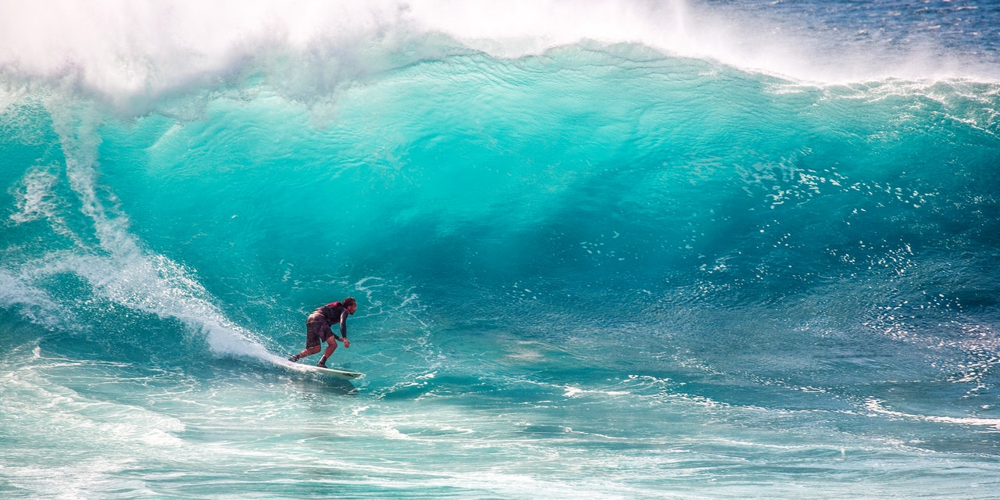

In [2]:
# Specify the model endpoint url. This is the API to which we will send the input data to.
# If we are using a Docker container, this is http://localhost:5000.
model_endpoint = 'http://max-image-caption-generator.max.us-south.containers.appdomain.cloud/' + 'model/predict'

# Specify the input image
path_to_input_image = 'example_data/images/surfing.jpg'

# Show the input image
notebook_image(path_to_input_image)

**Generating the output captions**

Post the input image to the model API using the requests library in Python. The model will return the output captions which we will print out below.

In [3]:
# Upload an image to the MAX model's rest API
with open(path_to_input_image, 'rb') as file:
    file_form = {'image': (path_to_input_image, file, 'image/png')}
    # Post the image to the rest API using the requests library
    r = requests.post(url=model_endpoint, files=file_form)
    # Return the JSON
    response = r.json()

# Show the output
print('----OUTPUT CAPTIONS----\n')
for i, x in enumerate(response['predictions']):
    print(str(i+1)+'.', x['caption'])

----OUTPUT CAPTIONS----

1. a man riding a wave on top of a surfboard .
2. a person riding a surf board on a wave
3. a man riding a wave on a surfboard in the ocean .


## 2. MAX Human Pose Estimator

In this example, we show how the MAX-Human-Pose-Estimator model can be used to detect and visualize the human poses from an image.

- Input: Image
- Output: Coordinates of the human pose

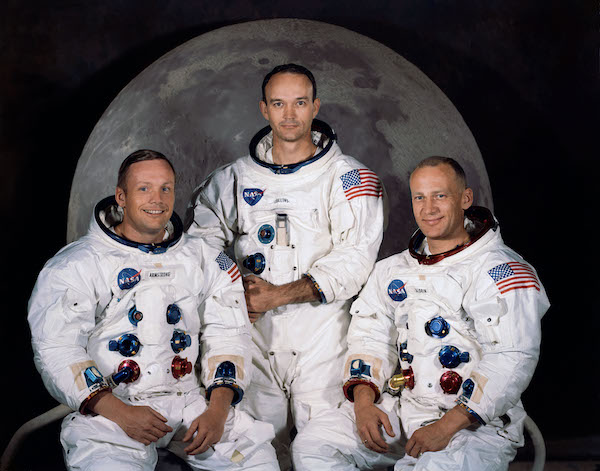

In [4]:
# Specify the model endpoint url. This is the API to which we will send the input data to.
# If we are using a Docker container, this is http://localhost:5000.
model_endpoint = 'http://max-human-pose-estimator.max.us-south.containers.appdomain.cloud/' + 'model/predict'

# Specify the input image
path_to_input_image = 'example_data/images/astronauts.jpg'

# Load in original image
org_img = np.asarray(Image.open(path_to_input_image))

# Show the input image
notebook_image(path_to_input_image)

**Generating the coordinates of the output poses as a JSON format**

In [5]:
# Upload an image to the MAX model's rest API
with open(path_to_input_image, 'rb') as file:
    file_form = {'file': (path_to_input_image, file, 'images/jpeg')}
    # Post the image to the rest API using the requests library
    r = requests.post(url=model_endpoint, files=file_form)
    # Return the JSON
    response = r.json()

Now that we have the coordinates of the human poses as a json format, we can visualize them with the functions below.

**Visualize the detected poses**

In [6]:
# Define the colors for different human body parts.
CocoColors = [[255, 0, 0], [255, 85, 0], [255, 170, 0], [255, 255, 0], 
              [170, 255, 0], [85, 255, 0], [0, 255, 0], [0, 255, 85], 
              [0, 255, 170], [0, 255, 255], [0, 170, 255], [0, 85, 255], 
              [0, 0, 255], [85, 0, 255], [170, 0, 255], [255, 0, 255], 
              [255, 0, 170], [255, 0, 85]]

# Visualize the detected human poses on the image. The returned JSON result 
# contains the pose lines for each person in the input image. Each 
# person may have multiple pose lines. Each pose line contains four coordinates 
# for the start and end points as [x1, y1, x2, y2]. The `cv2.line(img, (x1, y1), 
# (x2, y2), color, thickness)` function is utilized to visualize the detected
# pose lines.
def draw_pose(preds, img):
    humans = preds['predictions']
    for human in humans:
        pose_lines = human['pose_lines']
        for i in range(len(pose_lines)):
            line = pose_lines[i]['line']
            cv2.line(img, (line[0], line[1]), (line[2], line[3]), CocoColors[i], 3)

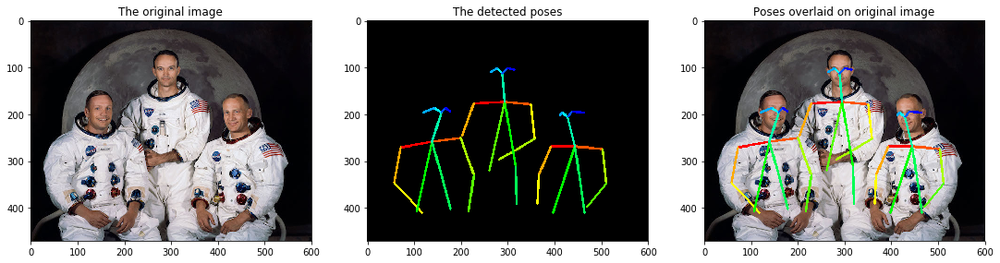

In [7]:
# Visualize the detected poses overlaid on the original image.
fig = plt.figure()
fig.set_size_inches(18.5, 10.5)

plt.subplot(1, 3, 1)
plt.imshow(org_img)
plt.title("The original image")

pose_img = np.zeros(np.asarray(org_img).shape, dtype=np.uint8)
draw_pose(response, pose_img)
plt.subplot(1, 3, 2)
plt.imshow(pose_img)
plt.title("The detected poses")

overlaid_img = org_img.copy()
draw_pose(response, overlaid_img)
plt.subplot(1, 3, 3)
plt.imshow(overlaid_img)
plt.title("Poses overlaid on original image")

plt.show()

## 3. MAX Fast Neural Style Transfer

This model generates a new image that mixes the content of a source image (presets: mosaic, candy, rain princess, udnie) with the style of another input image.

- Input: an image and a style (mosaic, candy, rain princess, udnie)
- Output: a restyled image

**The input image**

Set up the Model API and specify the input.

https://developer.ibm.com/exchanges/models/all/max-fast-neural-style-transfer/

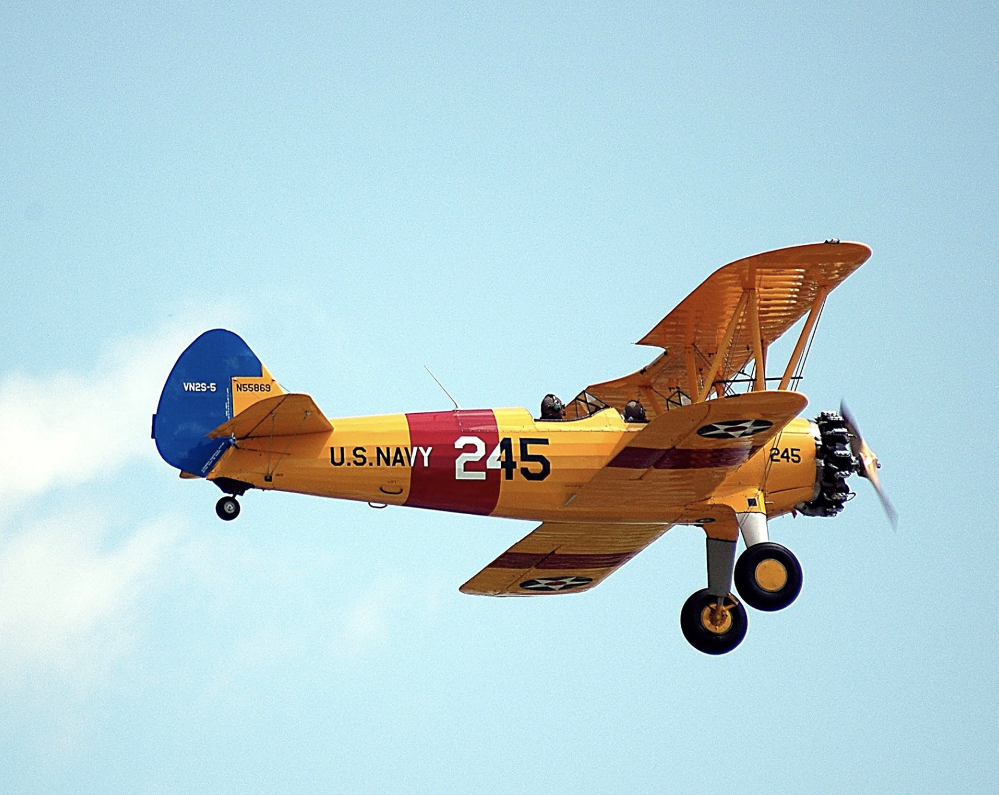

In [8]:
# Specify the model endpoint url. This is the API to which we will send the input data to.
# If we are using a Docker container, this is http://localhost:5000.
model_endpoint = 'http://max-fast-neural-style-transfer.max.us-south.containers.appdomain.cloud/' + 'model/predict'

# Choose the style as a parameter in the API url (only pick one)
model_endpoint += '?model=mosaic'
# model_endpoint += '?model=candy'
# model_endpoint += '?model=rain_princess'
# model_endpoint += '?model=udnie'


# Specify the input image
path_to_input_image = 'example_data/images/airplane.png'

# Show the input image
notebook_image(path_to_input_image)

**Generating the restyled output image**

Post the input image to the model API using the requests library in Python. The model will return the output image and we will plot it below.

CPU times: user 164 ms, sys: 43.8 ms, total: 207 ms
Wall time: 1min 13s


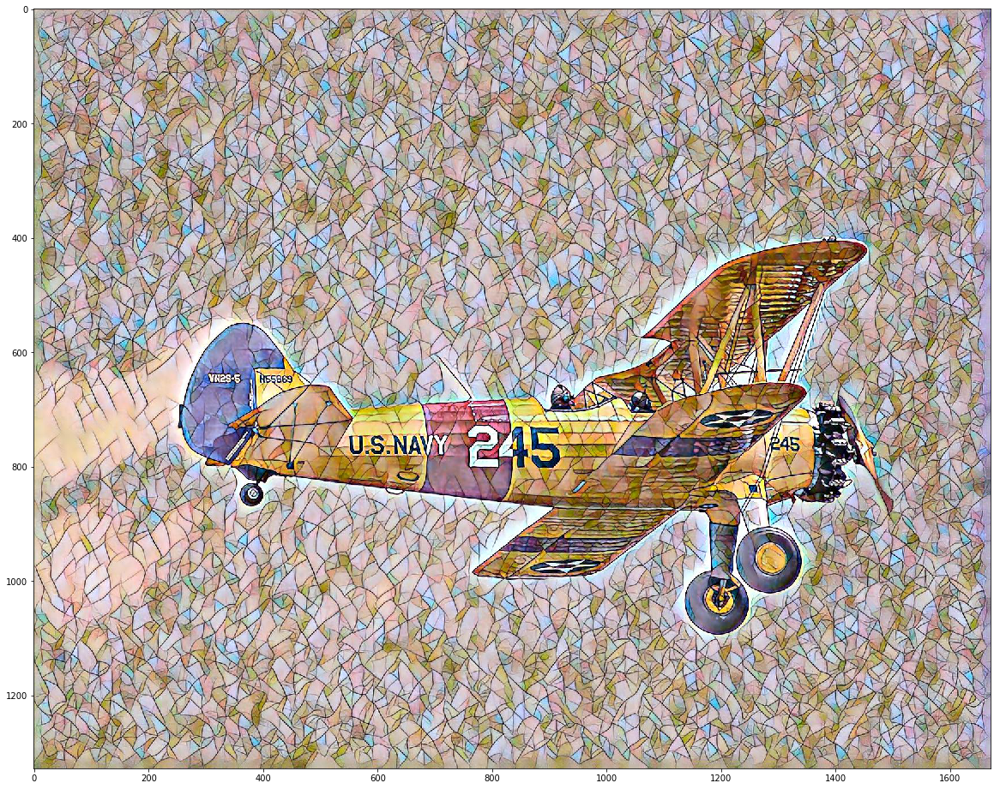

In [9]:
%%time

# Upload an image to the MAX model's rest API
with open(path_to_input_image, 'rb') as file:
    file_form = {'image': (path_to_input_image, file, 'image/png')}
    # Post the image to the rest API using the requests library
    response = requests.post(url=model_endpoint, files=file_form)
    # Load the output image into memory
    output_image = Image.open(io.BytesIO(response.content))

# Plot the output image
plt.figure(figsize=(20,20))
imshow(np.asarray(output_image))

## 4. MAX Audio Classifier

This model predicts the class of a (short) audio fragment.

Example classes: siren, applause, music, ...

- Input: Audio file (.wav)
- Output: The classes sorted by descending probability

**Input audio**

In [10]:
# Specify the model endpoint url. This is the API to which we will send the input data to.
# If we are using a Docker container, this is http://localhost:5000.
model_endpoint = 'http://max-audio-classifier.max.us-south.containers.appdomain.cloud/' + 'model/predict'

# Specify the input audio file
path_to_input_audio = 'example_data/audio/birds1.wav'
#path_to_input_audio = 'example_data/audio/piano.wav'
#path_to_input_audio = 'example_data/audio/siren.wav'

# Play the input audio file
notebook_audio(path_to_input_audio)

**Predict the top 3 class labels and their probabilities**

In [11]:
# Upload an audio file to the MAX model's rest API
with open(path_to_input_audio, 'rb') as file:
    file_form = {'audio': (path_to_input_audio, file, 'audio/wav')}
    # Post the image to the rest API using the requests library
    r = requests.post(url=model_endpoint, files=file_form)
    # Return the JSON
    response = r.json()

# Print out the top 3 labels and their probabilities
for i,x in enumerate(response['predictions'][:3]):
    print(str(i+1) + '. ' + x['label'] + ' | probability: ' + str(round(x['probability'], 2)))

1. Bird | probability: 0.48
2. Bird vocalization, bird call, bird song | probability: 0.24
3. Chirp, tweet | probability: 0.19


## 5. MAX Facial Age Estimator

This model detects faces in a given image and for each face estimates its age.

- input: image
- output: bounding box for each face along with estiamted age

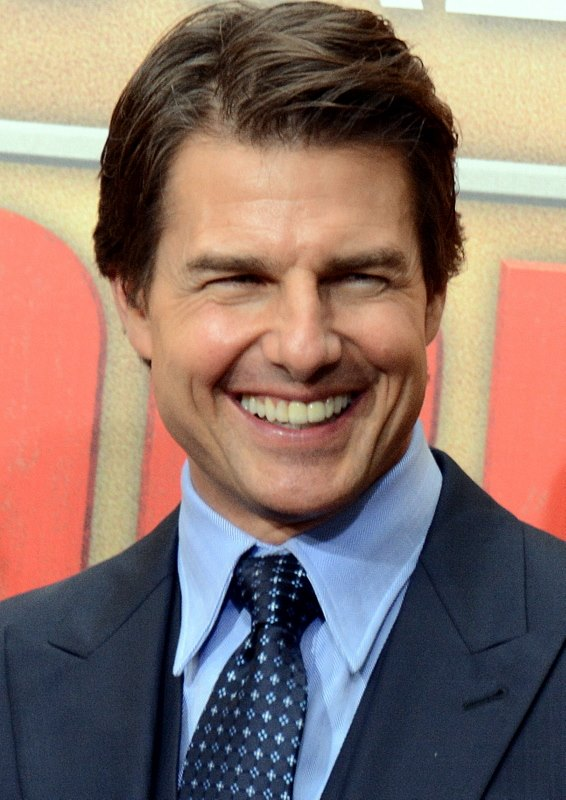

In [10]:
# Specify the model endpoint url. This is the API to which we will send the input data to.
# If we are using a Docker container, this is http://localhost:5000.
model_endpoint = 'http://max-facial-age-estimator.max.us-south.containers.appdomain.cloud/'+'model/predict'

# Specify the input image
path_to_input_image = 'example_data/images/tom.jpg'

# Show the input image
notebook_image(path_to_input_image)

In [11]:
# Upload an image to the MAX model's rest API
with open(path_to_input_image, 'rb') as file:
    file_form = {'image': (path_to_input_image, file, 'images/jpeg')}
    # Post the image to the rest API using the requests library
    r = requests.post(url=model_endpoint, files=file_form)
    # Return the JSON
    response = r.json()

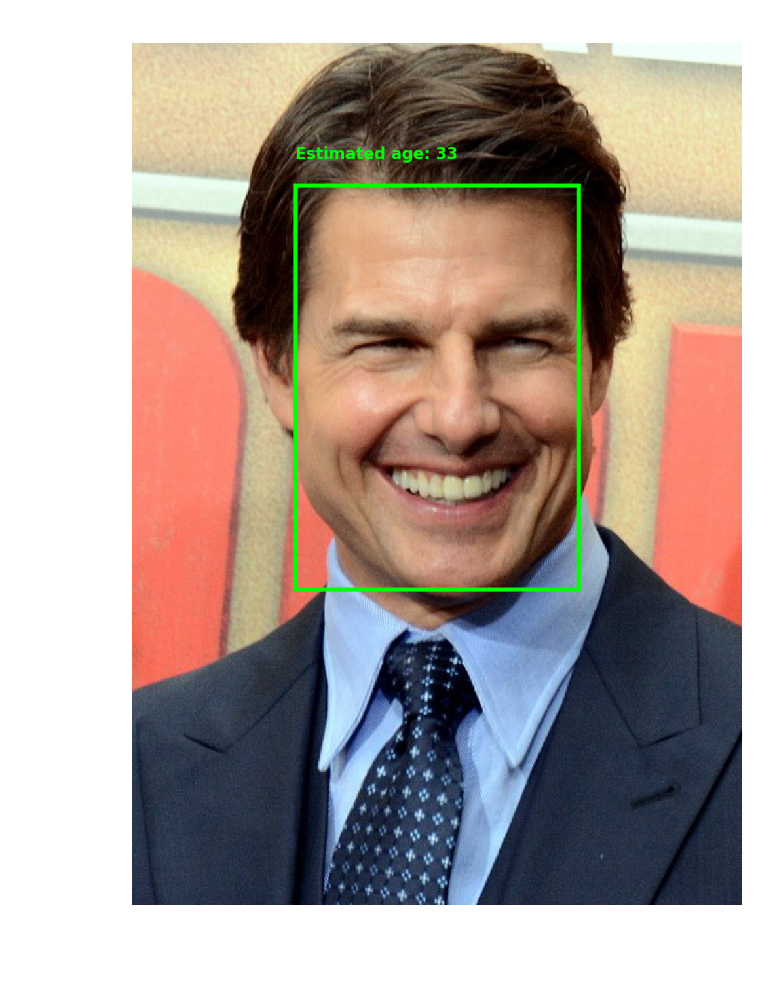

In [12]:
image = plt.imread(path_to_input_image)
fig, ax = plt.subplots()
# Set larger figure size
fig.set_dpi(400)
# Display the image
plt.imshow(image)
color = '#00FF00'
# For each face, draw the bounding box and predicted emotion class together with the probability
for prediction in response['predictions']:
    bbox = prediction['face_box']
    # Unpack the coordinate values
    x1, y1, w, h = bbox
    age_estimation = 'Estimated age: ' + str(prediction['age_estimation'])
   
    # Create the bounding box rectangle - we need the base point (x, y) and the width and height of the rectangle
    rectangle = patches.Rectangle((x1, y1), w, h, linewidth=1, edgecolor=color, facecolor='none')
    ax.add_patch(rectangle)
    # Plot the emotion class and probability text
    plt.text(x1, y1 - 25, age_estimation, fontsize=4, color=color, fontweight='bold')
    
plt.axis('off')
plt.show()

## 6. MAX Named Entity Tagger

This model is able to understand text and tags Named Entities ([Wikipedia](https://en.wikipedia.org/wiki/Named_entity)) in sentences.

- input: sentence
- output: named entities and the corresponding entity category

**The input**

In [12]:
# Specify the model endpoint url. This is the API to which we will send the input data to.
# If we are using a Docker container, this is http://localhost:5000.
model_endpoint = 'http://max-named-entity-tagger.max.us-south.containers.appdomain.cloud/' + 'model/predict'

# Specify the input sentence
input_text = 'John lives in Brussels and works for the EU'

**Predict the named entity tags**

In [13]:
# Post the input text as JSON to the rest API using the requests library
r = requests.post(url=model_endpoint, json={"text":input_text})
# Return the JSON
response = r.json()

# Print out the tags per word
for i in range(len(response['prediction']['tags'])):
    print(response['prediction']['terms'][i] + ' - ' + response['prediction']['tags'][i])

John - B-PER
lives - O
in - O
Brussels - B-GEO
and - O
works - O
for - O
the - O
EU - B-ORG


# Exercise: Query the Object Detector using Python

Given the examples above, you should be able to write some lines of Python code in order to query the object detector. You should already have the object detector on `http://0.0.0.0:5000` after completing the first step of the tutorial. Good luck! 

**Specify the input image**

In [ ]:
# Specify the model endpoint url. This is the API to which we will send the input data to.
# If we are using a Docker container, this is http://localhost:5000/model/predict.
model_endpoint = ...

# Specify the input image
path_to_input_image = ...

# Show the input image
notebook_image(path_to_input_image)

**Post the input image to the model**

In [ ]:
# 1. Open the input image
...
# 2. Post the input image
...
# 3. Parse the response from the post request to JSON format
...

**Print the output predictions**

In [ ]:
print(response)

# Done!

Now it's time to integrate a MAX model in a webapp. Go back to the tutorial and complete the next step, or click [here](https://github.ibm.com/CODAIT/max-workshop-svl#32-creating-your-own-object-detector-webapp)!

# Looking for more Open Source AI tools?

Visit [https://developer.ibm.com/exchanges/models/](https://developer.ibm.com/exchanges/models/) for the following models:


<img src="docs/codait-logo.png" align="right" style="width:40px">
<img src="docs/ibm-logo.png" align="right" style="width:200px">

**Image-based models**
- MAX Fast Neural Style Transfer
- MAX Image Caption Generator
- Image Completer
- Human Pose Estimator
- Facial Recognizer
- Image Colorizer
- Image Segmenter
- Breast Cancer Mitosis Detector
- Nucleus Segmenter
- Inception ResNet v2
- Facial Age Estimator
- Image Caption Generator
- Object Detector
- ResNet50 Image Classifier
- Scene Classifier
- Sports Video Classifier
- *Facial Emotion Classifier (coming soon)*
- *Image Super Resolution Generator (coming soon)*

**Text-based models**
- Named Entity Tagger
- Name Generator
- News Text Generator
- Review Text Generator
- Word Embedding Generator
- *Text Sentiment Classifier (coming soon)*
- *Speech Recognition*


**Audio-based models**
- Audio Classifier
- Audio Embedding Generator
- Audio Sample Generator

**Other**
- Weather Forecaster
- Spatial Transformer Network
- Adversarial Cryptography